# Lab 1: Independent Component Analysis

### Machine Learning 2 (2017/2018)

* The lab exercises should be made in groups of two people.
* The deadline is Thursday, April 19, 23:59.
* Assignment should be submitted through BlackBoard! Make sure to include your and your teammates' names with the submission.
* Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_studentid2\_lab#", for example, the attached file should be "12345\_12346\_lab1.ipynb". Only use underscores ("\_") to connect ids, otherwise the files cannot be parsed.

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [1]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


The following code generates some toy data to work with.

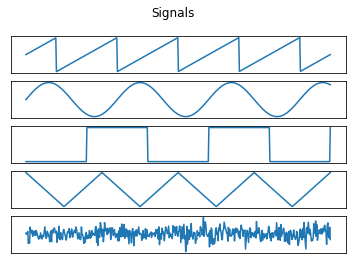

In [2]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [3]:
### 1.1 Make mixtures
def make_mixtures(S, A):
    # YOUR CODE HERE    
    return A.dot(S)    

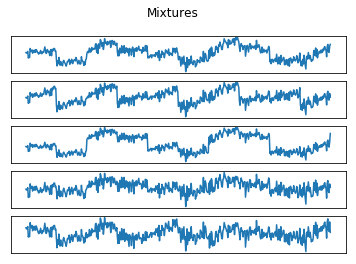

In [4]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

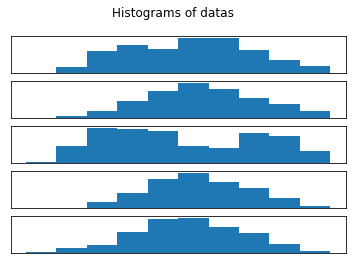

In [5]:
### 1.2 Histogram

# YOUR CODE HERE
def plot_histograms(X):
    
    title = "Histograms of datas"
    
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)        
        plt.hist(X[i, :])        
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)
            

plot_histograms(X)

Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

The second and fifth distributions look more like Gaussians, but the second distribution actually generated by sine function which has similar shape to gaussian distribution when we consider only single peak. The fifth distribution are gererated by gaussian distribution with mean = 0 and variance = 1. 

It's important because ICA assume that there is at most one gaussian distribution, otherwise the constraint of variance = 1 makes two gaussian distributions unidentifiable.

### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.

\begin{align}
& \phi_0(a) = -tanh \\
\Rightarrow & \phi_0(a) = \frac{d \ln p_0(a)}{da} \\
\Rightarrow & \int_{\infty}^{\infty} -tanh(a)da = \ln p_0(a) \\
\Rightarrow & p_0(a) \propto \frac{1}{2 \cdot cosh(a)}
\end{align}

Similarly,

\begin{align}
p_1(a) &\propto 2 \cdot cosh(a) \cdot e^{-\frac{1}{2} \cdot a^2} \\
p_2(a) &\propto e^{\frac{-a^4}{4}} \\
p_3(a) &\propto (a^2 + 5)^{-3} \\
\end{align}

In [6]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    # YOUR CODE HERE
    return 1 / (np.cosh(a) * 2)    

In [7]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    # YOUR CODE HERE
    return 2 * np.cosh(a) * e ** (-1/2 * a ** 2)    

In [8]:
def phi_2(a):
    return -a**3

def p_2(a):
    # YOUR CODE HERE    
    return e ** (-a ** 4 / 4)

In [9]:
def phi_3(a):
    return -6*a / (a**2 + 5)

def p_3(a):
    # YOUR CODE HERE
    return (a ** 2 + 5) ** -3    

In [10]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

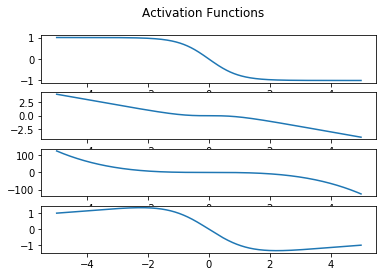

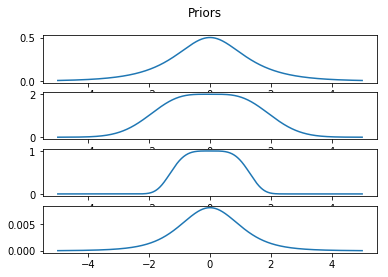

In [11]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)

# YOUR CODE HERE
figure()

for i in range(len(activation_functions)):
    ax = plt.subplot(len(activation_functions), 1, i + 1)    
    plt.plot(a, activation_functions[i](a))

plt.suptitle("Activation Functions")
    
figure()

for i in range(len(priors)):   
    ax = plt.subplot(len(priors), 1, i + 1)
    plt.plot(a, priors[i](a))

plt.suptitle("Priors")
print()

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [12]:
### 1.4 Whitening
def whiten(X):
    
    # YOUR CODE HERE
    #S = np.zeros(shape=(X.shape[1], X.shape[1]))
    X_col_mean = np.mean(X, 1).reshape(X.shape[0],1)  
    #print(X)
    
    X_new = X - X_col_mean    
    S = X_new.dot(X_new.T)
    S = S / X.shape[1]    
    
    eigen_values, eigen_vectors =  numpy.linalg.eigh(S)
        
    print("Check eigenvector and eigenvalue: ", S.dot(eigen_vectors[:,0]) - eigen_values[0] * eigen_vectors[:,0])
    
    L = np.diag(eigen_values)
    L_new = np.diag(eigen_values ** (-1/2))    
    
    Xw = L_new.dot(eigen_vectors.T).dot(X_new)               
        
    return Xw
    

In [13]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


Check eigenvector and eigenvalue:  [ 4.35415592e-16  1.83447008e-16  2.37657116e-16  6.46184495e-17
 -1.47451495e-16]


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

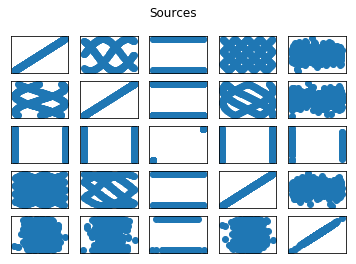

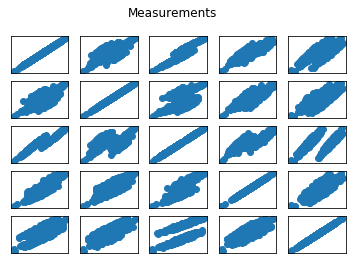

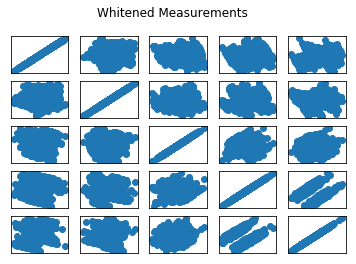

In [14]:
figure()   
for i in range(S.shape[0]):
    for j in range(S.shape[0]):
        ax = plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(S[i,:], S[j,:])
        ax.set_xticks([])
        ax.set_yticks([])   
        
plt.suptitle("Sources")

figure()
for i in range(X.shape[0]):
    for j in range(X.shape[0]):
        ax = plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(X[i,:], X[j,:])
        ax.set_xticks([])
        ax.set_yticks([])
        
plt.suptitle("Measurements")
        
figure()   
for i in range(Xw.shape[0]):
    for j in range(Xw.shape[0]):
        ax = plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(Xw[i,:], Xw[j,:])
        ax.set_xticks([])
        ax.set_yticks([])
        
plt.suptitle("Whitened Measurements")
print()

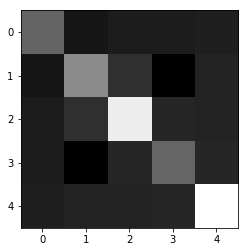

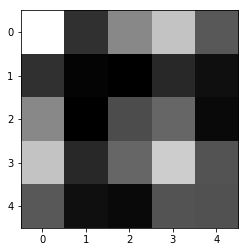

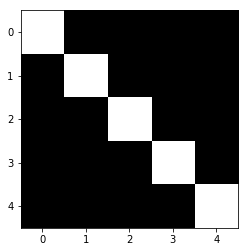

In [15]:
### 1.5 Interpret results of whitening
# YOUR CODE HERE

Sigma = np.zeros(shape=(S.shape[0], S.shape[0]))
S_row_mean = np.mean(S, 1).reshape(S.shape[0], 1)
S_new = S - S_row_mean

Sigma = S_new.dot(S_new.T)
Sigma = Sigma / S.shape[1]

figure()
ax = imshow(Sigma, cmap='gray', interpolation='nearest')

Sigma_x = X.dot(X.T)
Sigma_x = Sigma_x / X.shape[1]

figure()
ax = imshow(Sigma_x, cmap='gray', interpolation='nearest')

Sigma_Xw = Xw.dot(Xw.T)
Sigma_Xw = Sigma_Xw / Xw.shape[1]

figure()
ax = imshow(Sigma_Xw, cmap='gray', interpolation='nearest')

Are the signals independent after whitening?

We only can say signals are uncorrelated.

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

When updating our model parameters with iteration, we pick the $\Delta \omega$ which is covariant with respect to linear rescaling of $\omega$.

If $\Delta \omega$ has the following property, the algorithm is a covariant algorithm:
$\Delta \omega_i = \eta \sum_{i'}M_{ii'} \frac{\partial L}{\partial \omega_i} $

The dimension of left-hand side and right-hand side with relative to $\omega$ are consistent.

There are different ways to get this matrix, one is Newton's algorithm, another is to create a matrix with dimension $\omega^2$

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [16]:
### 1.7 Independent Component Analysis
def ICA(X, activation_function, learning_rate=0.01):
    # YOUR CODE HERE    
    if learning_rate == 0.01:
        NUM_ITERATION = 10000
    else:
        NUM_ITERATION = 100000
    W = np.random.rand(X.shape[0], X.shape[0]) / 30    
    for i in range(NUM_ITERATION):        
        A = W.dot(X)
        
        #vectorized_activation_function = np.vectorize(lambda a: activation_function(a))        
        #Z = vectorized_activation_function(A)    
        Z = activation_function(A)
        X_new = W.T.dot(A)
        
        d_W = (W + Z.dot(X_new.T)) / X.shape[0]
        W = W + d_W * learning_rate 
        
        if X.shape[1] > 500 and i != 0 and i % 200000 == 0:
            learning_rate = learning_rate / 2
        
        if i % 1000 == 0:
            print("grad: ", np.linalg.norm(d_W))        
        
    print("Final grad: ", np.linalg.norm(d_W))
    
    return W
    
W_est = ICA(Xw, phi_3)  # Compare with ICA(X)

grad:  0.05062726840484727
grad:  0.0038419979009932568
grad:  0.0001821322873936159
grad:  3.742475646758347e-06
grad:  1.558637362797546e-06
grad:  1.5576007164115174e-06
grad:  1.5577911474455672e-06
grad:  1.557981790748897e-06
grad:  1.5581722970829594e-06
grad:  1.5583626664585513e-06
Final grad:  1.5585527078014374e-06


In [17]:
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])


grad:  0.046759596893730083
grad:  0.003446361942277416
grad:  0.00021165821778750855
grad:  4.848985464286319e-06
grad:  2.7511286958840667e-06
grad:  2.7479014693000272e-06
grad:  2.7456404867062765e-06
grad:  2.743384413322632e-06
grad:  2.7411329314630577e-06
grad:  2.7388860567457574e-06
Final grad:  2.736646045010303e-06
grad:  0.017751990213838366
grad:  0.03545269286029791
grad:  0.025530512364299412
grad:  0.009130270858681283
grad:  0.0027741622402849943
grad:  0.0019332565191491264
grad:  0.0024817570791821437
grad:  0.0032333562374557492
grad:  0.0033834358837704637
grad:  0.002708696292723548
Final grad:  0.0019049742899815785
grad:  0.01788319760408199
grad:  0.027508609010193825
grad:  0.009126438096439623
grad:  0.008730630416719494
grad:  0.0068474143970652865
grad:  0.0033979698129369784
grad:  0.0021017930776882137
grad:  0.0015426024841597367
grad:  0.001177722064129203
grad:  0.0009106179330401859
Final grad:  0.0007369826392769209
grad:  0.10140036537615563
grad: 

### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

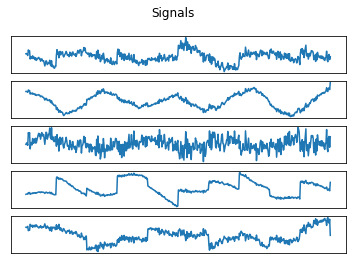

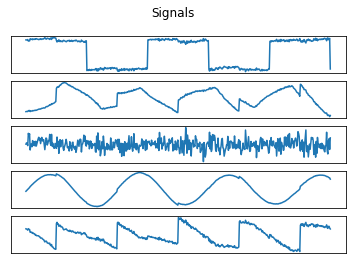

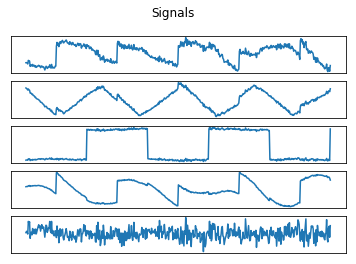

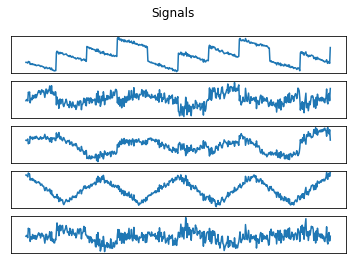

In [18]:
# 1.8 Experiments
# YOUR CODE HERE
for W_est in W_estimates:
    S_recover = W_est.dot(Xw)
    plot_signals(S_recover)

In [19]:
W_estimates_without_w = [ICA(X, activation_function=phi) for phi in activation_functions]

grad:  0.21257024360738636
grad:  0.027182386431607877
grad:  0.007897516018522531
grad:  0.000199977594099013
grad:  1.3526280154826537e-05
grad:  1.449233444345078e-05
grad:  1.4523065900976277e-05
grad:  1.4528595742544015e-05
grad:  1.4533626467517388e-05
grad:  1.4538610014147873e-05
Final grad:  1.4543549610332995e-05
grad:  0.016643458324007643
grad:  0.054613103186162644
grad:  0.14899898443839485
grad:  0.02465361907131269
grad:  0.09297203750205041
grad:  0.00866859939732348
grad:  0.0087322265115971
grad:  0.010910882978288818
grad:  0.014856338536583844
grad:  0.019388931547326845
Final grad:  0.020992120756766226
grad:  0.010774593467499422
grad:  0.036583343143849895
grad:  0.10188887280407602
grad:  0.051111435748391505
grad:  0.02884748304311842
grad:  0.02019028602906172
grad:  0.013966986987081154
grad:  0.01051253262427203
grad:  0.008618934315337383
grad:  0.007801793627352714
Final grad:  0.007775350435757023
grad:  0.25846865699343663
grad:  0.01897441117559113
gr

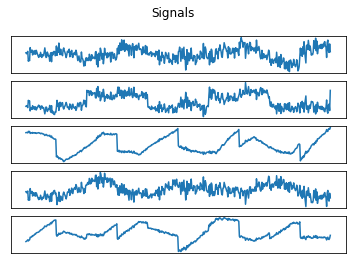

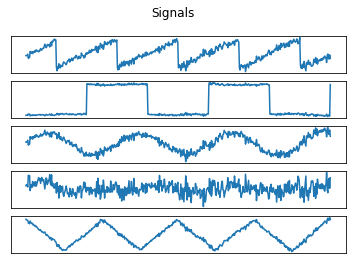

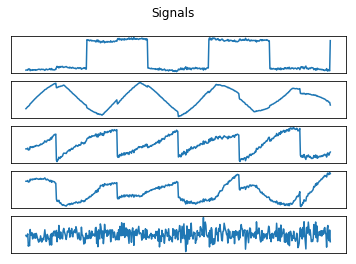

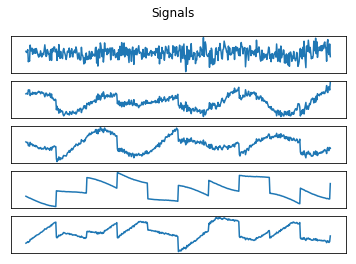

In [20]:
for W_est in W_estimates_without_w:
    S_recover = W_est.dot(X)
    plot_signals(S_recover)

Yes, according to listed values of gradient, whiten datas converge faster.

In [21]:
def does_whitening_make_a_difference():
    # Does it make a difference (in terms of speed of convergence) 
    # if you whiten your data before running ICA?    
    # Return True or False
    # YOUR CODE HERE    
    
    #Yes, according to listed values of gradient, whiten datas converge faster.
    
    return True
    #raise NotImplementedError()

In [22]:
assert type(does_whitening_make_a_difference()) == bool

### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [23]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

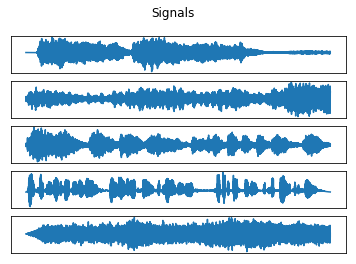

In [24]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

Check eigenvector and eigenvalue:  [ 5.08953235e-09 -1.04228093e-09  7.63975549e-11 -4.51109372e-10
 -1.80443749e-09]
grad:  28.57431335238165
grad:  0.0032457030412627597
grad:  0.0010494485727627983
grad:  0.0004997717071202352
grad:  0.000276600056377207
grad:  0.00016513209664878708
grad:  0.00010291015213291907
grad:  6.581860320986747e-05
grad:  4.278614671138862e-05
grad:  2.810555820270354e-05
grad:  1.8588121078786458e-05
grad:  1.2348722830688103e-05
grad:  8.228012551413313e-06
grad:  5.493168311642685e-06
grad:  3.672153381282858e-06
grad:  2.4569670245660596e-06
grad:  1.6448728645814434e-06
grad:  1.1016298062657622e-06
grad:  7.379945363508712e-07
grad:  4.944783062285737e-07
grad:  3.313546699890522e-07
grad:  2.220621624408156e-07
grad:  1.4882708867081125e-07
grad:  9.974966427116769e-08
grad:  6.685994238574167e-08
grad:  4.4818814329562844e-08
grad:  3.0049173967489693e-08
grad:  2.015442756063975e-08
grad:  1.3529176700790302e-08
grad:  9.09853192264194e-09
grad:  

grad:  0.00036242872029003365
grad:  0.0003571401874239119
grad:  0.0003517789191996343
grad:  0.00034635750521875967
grad:  0.0003408883923514534
grad:  0.00033538378824126845
grad:  0.0003298555740449167
grad:  0.00032431522696731017
grad:  0.0003187737529411481
grad:  0.00031324162959865594
grad:  0.0003077287594952874
grad:  0.00030224443337446865
grad:  0.0002967973031126645
grad:  0.0002913953638561988
grad:  0.00028604594475536836
grad:  0.00028075570761955046
grad:  0.00027553065275570405
grad:  0.0002703761312131586
grad:  0.0002652968626365164
grad:  0.00026029695792470373
grad:  0.0002553799459056129
grad:  0.0002505488032597507
grad:  0.0002458059869611188
grad:  0.00024115346854711482
grad:  0.0002365927695791862
grad:  0.00023212499771089302
Final grad:  0.00022775521001548062
grad:  45.838845492711606
grad:  0.0027565274420411415
grad:  0.0008852617705350522
grad:  0.00042897382792184054
grad:  0.00025740239496459884
grad:  0.00018991831703785787
grad:  0.000169227757084

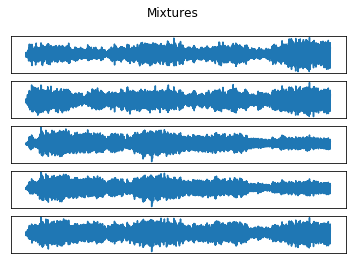

In [25]:
### 1.9 Audio demixing
# YOUR CODE HERE

A_audio = random_nonsingular_matrix(d=S_audio.shape[0])
X_audio = make_mixtures(S_audio, A_audio)
plot_signals(X_audio, "Mixtures")

Xw_audio = whiten(X_audio)

W_estimates_audio = [ICA(Xw_audio, activation_function=phi, learning_rate=0.001) for phi in activation_functions]


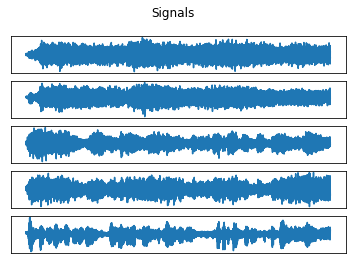

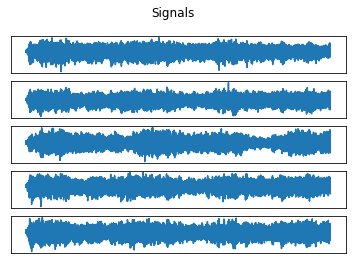

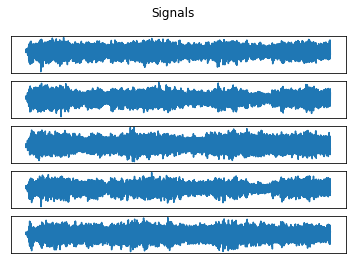

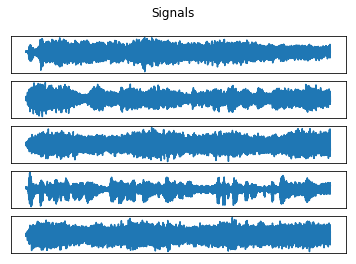

In [26]:
for W_est in W_estimates_audio:
    S_recover_audio = W_est.dot(Xw_audio)
    plot_signals(S_recover_audio)    

In [31]:
for W_est in W_estimates_audio:
    play_signals(S_recover_audio, sample_rate)

Signals

Signals

Signals

Signals

Report your results. Using which activation functions ICA recovers the sources?

$\phi_0$ and $\phi_3$, these two at least obviously recovered street audio source according to the sound. The other sources are not very distinguishable. $\phi_0$ and $\phi_3$ also both converge to low gradients.

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

\begin{align}
&p_0(a) \propto \frac{1}{2 \cdot cosh(a)} \\
& \int_{\infty}^{\infty} \frac{1}{2 \cdot cosh(a)} da = \frac{\pi}{2} \\
\Rightarrow & p_0(a) = \frac{1}{\pi \cdot cosh(a)} \\
\Rightarrow & \mu = \int_{\infty}^{\infty} a \cdot p_0(a) da = 0 \\
\Rightarrow & Kurtosis_0 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3 = \frac{5 \pi^5/32}{(\pi^3 / 8)^2} - 3
\\
Similarly, \\
&p_1(a) \propto 2 \cdot cosh(a) \cdot e^{-\frac{1}{2} \cdot a^2} \\
\Rightarrow & p_1(a) = \frac{cosh(a) \cdot e^{-\frac{1}{2} \cdot a^2}}{\sqrt{2e\pi}} \\
\Rightarrow & Kurtosis_1 = \frac{10}{2^2} - 3
\\\\
&p_2(a) \propto e^{\frac{-a^4}{4}} \\
\Rightarrow & p_2(a) = \frac{\sqrt{2}}{\Gamma(\frac{1}{4})} \cdot e^{\frac{-a^4}{4}} \\
\Rightarrow & Kurtosis_2 = \frac{1}{(2 \cdot \Gamma(3/4) / \Gamma(1/4))^2} - 3
\\\\
&p_3(a) \propto (a^2 + 5)^{-3} \\
\Rightarrow & p_3(a) = \frac{200 \sqrt{5}}{3\pi} (a^2 + 5)^{-3} \\
\Rightarrow & Kurtosis_3 = \frac{25}{(5/3)^2} - 3
\end{align}

In [28]:
### Include your answer here (you can use math.gamma if needed)
def get_kurtosis():
    # Return a list with 4 numbers / expressions
    # return [0, 0, 0, 0]    
    # YOUR CODE HERE    
    p0_mu = 0
    p0_u4 = 5 * np.pi ** 5 / 32
    p0_sigma4 = (np.pi ** 3 / 8) ** 2
    kurtosis_0 = p0_u4 / p0_sigma4 - 3
    
    p1_mu = 0
    p1_u4 = 10
    p1_sigma4 = 2 ** 2
    kurtosis_1 = p1_u4 / p1_sigma4 - 3
    
    p2_mu = 0
    p2_u4 = 1
    p2_sigma4 = (2 * math.gamma(3/4) / math.gamma(1/4)) ** 2
    kurtosis_2 = p2_u4 / p2_sigma4 - 3
    
    p3_mu = 0
    p3_u4 = 25
    p3_sigma4 = (5 / 3) ** 2
    kurtosis_3 = p3_u4 / p3_sigma4 - 3          
    
    return [kurtosis_0, kurtosis_1, kurtosis_2, kurtosis_3] 
    
    #raise NotImplementedError()
    

In [29]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


[0.18309886183790747, -0.5, -0.8115603847735238, 5.999999999999998]


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [30]:
### 1.10.2 Excess Kurtosis
# YOUR CODE HERE
import scipy.stats

Kurtosis_S = scipy.stats.kurtosis(S, axis = 1, fisher = True)
Kurtosis_S_audio = scipy.stats.kurtosis(S_audio, axis = 1, fisher = True)

print("Kurtosis of different synthetic signals: ", Kurtosis_S)
print("Kurtosis of different real signals: ", Kurtosis_S_audio)

print()

print("Mean of Kurtosis of different synthetic signals: ", np.mean(Kurtosis_S))
print("Mean of Kurtosis of different real signals: ", np.mean(Kurtosis_S_audio))


Kurtosis of different synthetic signals:  [-1.19640244 -1.48287113 -1.84019701 -1.2000384   0.21882481]
Kurtosis of different real signals:  [1.79431517 2.06885064 1.93609295 5.05191721 0.53887581]

Mean of Kurtosis of different synthetic signals:  -1.1001368354299725
Mean of Kurtosis of different real signals:  2.2780103551717046


For synthetic data, $\phi_1$ and $\phi_2$ have better recovered S and the Kurtosis of $\phi_1$ and $\phi_2$ are closer to Kurtosis calculated by scipy.stats.kurtosis with synthetic data.

For real data, $\phi_0$ and $\phi_3$ have better recovered S and the Kurtosis of $\phi_0$ and $\phi_3$ are closer to Kurtosis calculated by scipy.stats.kurtosis with real data.